<a href="https://colab.research.google.com/github/AbigailUchennaNkama/model-drift-simulation/blob/master/cifar09_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Trainning on 9 classes out of 10 of the cifar10 dataset.

In [2]:
import os
from torchvision import models
from torch import nn
import torch
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.types import Device

import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data.dataloader import DataLoader

device = "cuda" if torch.cuda.is_available() else "cpu"
device

'cpu'

In [ ]:
#get helper functions
try:
    from torchinfo import summary
except:
    print("[INFO] Couldn't find torchinfo... installing it.")
    !pip install -q torchinfo
    from torchinfo import summary

# Try to import the drift_modules directory and download it from GitHub if it doesn't work
try:
    from drift_modules import get_data, data_setup,plot,load_model,model_data, get_correct_preds_df
except:
    # Get the going_modular scripts
    print("[INFO] Couldn't find going_modular scripts... downloading them from GitHub.")
    !git clone https://github.com/AbigailUchennaNkama/model-drift-simulation
    !mv model-drift-simulation/drift_modules .
    !mv model-drift-simulation/cifar9_model.pth .
    !rm -rf model-drift-simulation
    from drift_modules import data_path_setup, plot, load_model, train_engine, get_all_data



[INFO] Couldn't find torchinfo... installing it.
[INFO] Couldn't find going_modular scripts... downloading them from GitHub.
Cloning into 'model-drift-simulation'...
remote: Enumerating objects: 223, done.
remote: Counting objects: 100% (56/56), done.
remote: Compressing objects: 100% (39/39), done.
remote: Total 223 (delta 36), reused 30 (delta 17), pack-reused 167
Receiving objects: 100% (223/223), 88.14 MiB | 21.44 MiB/s, done.
Resolving deltas: 100% (131/131), done.
Updating files: 100% (26/26), done.
Creating cifar10 dataset...


100%|██████████| 135107811/135107811 [00:02<00:00, 46136090.44it/s]


Creating cifar9 dataset...
Images organized into subfolders based on class names.


In [ ]:
#get test_dataloader
manual_transforms = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                            std=[0.229, 0.224, 0.225])
    ])

In [ ]:
#get train and val dataloaders
from drift_modules.data_path_setup import create_dataloaders

data_dir = './data/cifar9/train'
dataloaders, class_names, dataset_sizes = create_dataloaders(data_paths=data_dir)

In [ ]:
len(dataloaders['val']), len(class_names), dataset_sizes['val'], len(dataloaders['train'])

(79, 9, 5000, 625)

In [ ]:
#load and finetune pretrained model
model_c9 = models.resnet18(weights='IMAGENET1K_V1')
num_ftrs = model_c9.fc.in_features

# Here the size of each output sample is set to len(class_names).
model_c9.fc = nn.Linear(num_ftrs, 9)

model_c9 = model_c9.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer = optim.SGD(model_c9.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 69.7MB/s]


In [ ]:
# Print a finetuned conv_net model summary
summary(model=model_c9,
        input_size=(32, 3, 224, 224),
        # col_names=["input_size"],
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

In [ ]:
#Train model on 9 classes out of 10
from drift_modules import train_engine
model_ft = train_engine.train_model(model_c9, criterion, optimizer, exp_lr_scheduler,dataloaders,dataset_sizes, num_epochs=10)

Epoch 0/9
----------
train Loss: 0.5029 Acc: 0.8402
val Loss: 0.2272 Acc: 0.9224

Epoch 1/9
----------
train Loss: 0.1776 Acc: 0.9427
val Loss: 0.1844 Acc: 0.9374

Epoch 2/9
----------
train Loss: 0.1063 Acc: 0.9668
val Loss: 0.1661 Acc: 0.9442

Epoch 3/9
----------
train Loss: 0.0648 Acc: 0.9822
val Loss: 0.1580 Acc: 0.9484

Epoch 4/9
----------
train Loss: 0.0383 Acc: 0.9917
val Loss: 0.1597 Acc: 0.9476

Epoch 5/9
----------
train Loss: 0.0241 Acc: 0.9957
val Loss: 0.1618 Acc: 0.9512

Epoch 6/9
----------
train Loss: 0.0155 Acc: 0.9980
val Loss: 0.1629 Acc: 0.9504

Epoch 7/9
----------
train Loss: 0.0107 Acc: 0.9991
val Loss: 0.1592 Acc: 0.9516

Epoch 8/9
----------
train Loss: 0.0095 Acc: 0.9993
val Loss: 0.1629 Acc: 0.9496

Epoch 9/9
----------
train Loss: 0.0088 Acc: 0.9995
val Loss: 0.1629 Acc: 0.9500

Training complete in 35m 16s
Best val Acc: 0.951600


In [8]:
PATH = './cifar9_model_2.pth'
torch.save(model_ft.state_dict(), PATH, pickle_protocol=4)

In [9]:
#load pretrained model
from drift_modules.load_model import load_custom_pretrained_model
loaded_model_c9 = load_custom_pretrained_model(model_path='/content/cifar9_model_2.pth', num_classes=9)


In [14]:
import pandas as pd
from tqdm.auto import tqdm
from torchvision import  transforms
import torch
manual_transforms = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406],
                            std=[0.229, 0.224, 0.225])
    ])
# Get all test data paths

from pathlib import Path

data_dir = "/content/data/cifar10"
test_data_paths = list(Path(data_dir, "test", "truck").glob("*.png"))
test_labels = [path.parent.stem for path in test_data_paths]


# Inside the pred_and_store function
def pred_and_store(test_paths, model, transform, class_names, device):
    test_pred_list = []
    for path in tqdm(test_paths):
        # Create empty dict to store info for each sample
        pred_dict = {}

        # Get sample path
        pred_dict["image_path"] = path

        # Get class name
        class_name = path.parent.stem
        pred_dict["class_name"] = class_name

        # Get the true label from test_labels
        #true_label = test_labels[test_paths.index(path)]
        pred_dict["true_label"] = 9

        # Get prediction and prediction probability
        from PIL import Image
        img = Image.open(path)  # open image
        transformed_image = manual_transforms(img).unsqueeze(0)  # transform image and add batch dimension
        model.eval()
        with torch.inference_mode():
            pred_logit = model(transformed_image.to(device))
            pred_prob = torch.softmax(pred_logit, dim=1)
            pred_label = torch.argmax(pred_prob, dim=1)
            pred_class = class_names[pred_label.cpu()]

            # put things in the dictionary back on the CPU
            pred_dict["pred_prob"] = pred_prob.unsqueeze(0).max().cpu().item()
            pred_dict["pred_class"] = pred_class
            pred_dict["pred_label"] = pred_label.item()

        # Does the pred match the true label?
        pred_dict["correct"] = class_name == pred_class

        # Add the dictionary to the list of preds
        test_pred_list.append(pred_dict)

    return test_pred_list


test_pred_dicts = pred_and_store(test_paths=test_data_paths,
                                 model=loaded_model_c9,
                                 transform=manual_transforms,
                                 class_names=class_names,
                                 device=device)

  0%|          | 0/1000 [00:00<?, ?it/s]

In [31]:

import pandas as pd
test_pred_df = pd.DataFrame(test_pred_dicts)
preds_df = test_pred_df[test_pred_df["correct"]==False]
preds_df.tail(2)

,image_path,class_name,true_label,pred_prob,pred_class,pred_label,correct
998,/content/data/cifar10/test/truck/0224.png,truck,9,0.989255,automobile,1,False
999,/content/data/cifar10/test/truck/0420.png,truck,9,0.911597,automobile,1,False


In [16]:
preds_df['pred_class'].value_counts()

automobile    811
airplane       96
ship           74
cat             7
horse           6
dog             3
bird            2
frog            1
Name: pred_class, dtype: int64

In [ ]:
# Print a summary using torchinfo
summary(model=loaded_model_c9,
        input_size=(32, 3, 224, 224),
        # col_names=["input_size"],
        col_names=["input_size", "output_size", "num_params", "trainable"],
        col_width=20,
        row_settings=["var_names"]
)

In [18]:
import torch
import torchvision
import torchvision.transforms as transforms
from sklearn.manifold import TSNE
from torchvision import models
from joblib import dump
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from torch.utils.data.dataloader import DataLoader
device = "cuda" if torch.cuda.is_available() else "cpu"

# Load CIFAR10 dataset
transform = transforms.Compose([
    transforms.Resize(224),  # Resize to the input size expected by ResNet18
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize with ImageNet stats
])
testset = ImageFolder('/content/data/cifar10/test', transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=100, shuffle=False)

# Load pre-trained ResNet18 and remove the final classification layer
model = loaded_model_c9
model = torch.nn.Sequential(*(list(model.children())[:-1])).to(device) # Remove the last classification layer
model.eval()

# Extract embeddings
embeddings, labels, img = [], [], []
with torch.no_grad():
    for images, lbls in testloader:
        images,lbls = images.to(device), lbls.to(device)
        emb = model(images).squeeze(-1).squeeze(-1)  # After removing the last layer, there might be extra dimensions
        embeddings.append(emb)
        labels.append(lbls)
        img.append(images)
embeddings = torch.cat(embeddings).cpu()
labels = torch.cat(labels).cpu()
img = torch.cat(img).cpu()

# Reduce dimensionality using t-SNE
tsne = TSNE(n_components=2, random_state=0).fit_transform(embeddings)
#Save the t-SNE result
dump(tsne, 'tsne_embeddings.pkl')
torch.save(labels, 'labels.pt')
torch.save(img, 'img.pt')
torch.save(embeddings, 'embs.pt')


In [19]:
from sklearn.manifold import TSNE
from joblib import load
import torch
loaded_labels = torch.load('./labels.pt')
#loaded_img = torch.load('/content/img.pt')
# Load the t-SNE result
loaded_tsne = load('tsne_embeddings.pkl')
loaded_embeddings = torch.load('./embs.pt')

type(loaded_embeddings)

torch.Tensor

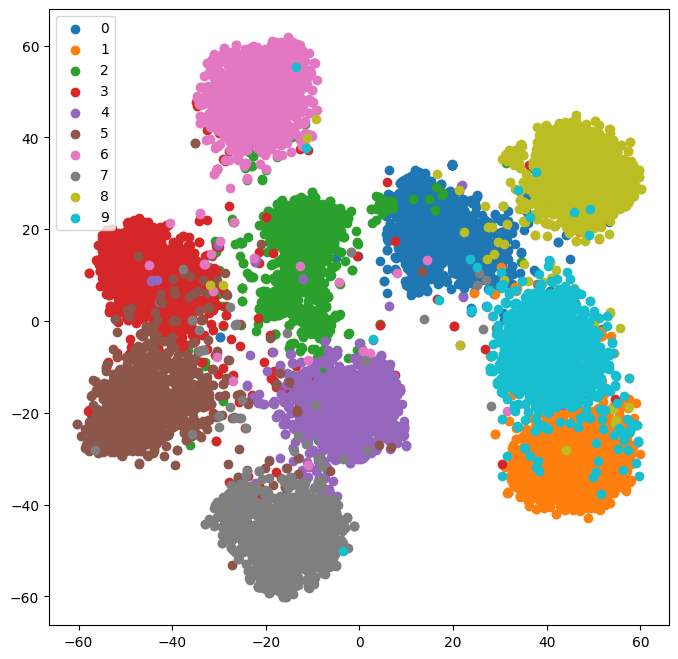

In [20]:
import matplotlib.pyplot as plt
tsne = TSNE(n_components=2, random_state=0).fit_transform(embeddings)
# Plot the t-SNE reduced embeddings
plt.figure(figsize=(8, 8))
for i in range(10):
    indices = loaded_labels == i
    plt.scatter(loaded_tsne[indices, 0], loaded_tsne[indices, 1], label=str(i))
plt.legend()
plt.show()

In [ ]:
pip install umap-learn

In [23]:
import umap
import plotly.express as px

# Use UMAP for dimensionality reduction
umap_model = umap.UMAP(n_components=2, n_neighbors=15, min_dist=0.1, metric='correlation')
reduced_embeddings = umap_model.fit_transform(loaded_embeddings)

# Map PyTorch tensor labels to class names
label_to_class = {
    0: 'airplane', 1: 'automobile', 2: 'bird', 3: 'cat', 4: 'deer',
    5: 'dog', 6: 'frog', 7: 'horse', 8: 'ship', 9: 'truck'
}

# Convert PyTorch tensor labels to integers and then to class names
class_names = [label_to_class[label.item()] for label in loaded_labels]

# Create a DataFrame for the UMAP data with class names
umap_df = pd.DataFrame({
    'UMAP_1': reduced_embeddings[:, 0],
    'UMAP_2': reduced_embeddings[:, 1],
    'Class': class_names  # Use class names for coloring
})

# Create a 2D scatter plot using Plotly
fig = px.scatter(
    umap_df,
    x='UMAP_1',
    y='UMAP_2',
    color='Class',  # Color by class names
    title='UMAP Visualization of ResNet18 CIFAR-10 Embeddings',
    labels={'Class': 'Class'},
    color_discrete_sequence=px.colors.qualitative.Set1  # Specify a color palette
)

fig.show()


In [ ]:
import os
import torch
import torchvision
import torchvision.transforms as transforms
from torch.utils.tensorboard import SummaryWriter
from torchvision.models import resnet18
device = "cuda" if torch.cuda.is_available() else "cpu"
device


# Create the directory if it doesn't exist
if not os.path.exists('./logs'):
    os.makedirs('./logs')


# 1. Prepare CIFAR10 data (just like before)
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])
testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=1000, shuffle=False)

# Load pre-trained ResNet18 and remove the final classification layer
model = loaded_model_c9
model = torch.nn.Sequential(*(list(model.children())[:-1])).to(device) # Remove the last classification layer
model.eval()

# 2. Prepare data for TensorBoard
# Write the labels and some sample images to a metadata file
metadata_file = './logs/metadata.tsv'
classes = testset.classes
with open(metadata_file, 'w') as f:
    for _, label in testloader:
        for lbl in label:
            f.write(classes[lbl] + '\n')

# 3. Log embeddings for TensorBoard
writer = SummaryWriter('./logs')
embeddings = []
with torch.no_grad():
    for images, labels in testloader:
        images,labels = images.to(device), labels.to(device)
        # Assuming `model` is your model
        embeddings = model(images).squeeze(-1).squeeze(-1)
        # Log embeddings
        writer.add_embedding(embeddings,
                             metadata=labels.tolist(),
                             label_img=images,
                             global_step=0)
        #break  # This is just for one batch. Remove if you want embeddings for the entire dataset.

writer.close()


In [30]:
%reload_ext tensorboard
%tensorboard --logdir ./logs

Reusing TensorBoard on port 6006 (pid 19314), started 0:09:41 ago. (Use '!kill 19314' to kill it.)

<IPython.core.display.Javascript object>